## Atributos do Dataset:
**MedInc**: Renda mediana dos residentes do bairro (em dezenas de milhares de dólares).\
**HouseAge**: Idade mediana das casas no bairro.\
**AveRooms**: Número médio de cômodos por casa.\
**AveBedrms**: Número médio de quartos por casa.\
**Population**: População do bairro.\
**AveOccup**: Número médio de ocupantes por casa.\
**Latitude**: Latitude do bairro.\
**Longitude**: Longitude do bairro.

### Variável Alvo:
**MedHouseVal**: Valor mediano das casas no bairro (em centenas de milhares de dólares).


#### Data
https://data.ca.gov/

**Public Schools 2021-22**: https://data.ca.gov/dataset/california-schools-2021-22 \
**Private Schools 2025**: https://data.ca.gov/dataset/california-private-schools \
**Hospitals**: https://data.ca.gov/dataset/california-hospital-ratings-for-transcatheter-aortic-valve-replacement-tavr-procedures/resource/5998424f-7cbe-4833-b7e5-d8d87c81cb27 \
**Food Affordability**: https://data.ca.gov/dataset/food-affordability \




##### Possible Data?

**Distance to Public Tranpsort**: https://data.ca.gov/dataset/walkable-distance-to-public-transit/resource/562989a9-7e40-4acb-bc74-d900fda4d0c5?view_id=ade33276-88ed-4a55-b858-84bcf55a7f04 \
**Water Quality**: https://data.ca.gov/dataset/surface-water-2018-california-water-quality-status-report



In [549]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [550]:
df = pd.read_csv('data/processed/california_housing.csv')
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [551]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       20640 non-null  float64
 1   HouseAge     20640 non-null  float64
 2   AveRooms     20640 non-null  float64
 3   AveBedrms    20640 non-null  float64
 4   Population   20640 non-null  float64
 5   AveOccup     20640 non-null  float64
 6   Latitude     20640 non-null  float64
 7   Longitude    20640 non-null  float64
 8   MedHouseVal  20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


In [552]:
num_columns = ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'MedHouseVal']
df[num_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
MedInc,20640.0,3.870671,1.899822,0.499900,2.563400,3.534800,4.743250,15.000100
HouseAge,20640.0,28.639486,12.585558,1.000000,18.000000,29.000000,37.000000,52.000000
AveRooms,20640.0,5.429000,2.474173,0.846154,4.440716,5.229129,6.052381,141.909091
AveBedrms,20640.0,1.096675,0.473911,0.333333,1.006079,1.048780,1.099526,34.066667
Population,20640.0,1425.476744,1132.462122,3.000000,787.000000,1166.000000,1725.000000,35682.000000
AveOccup,20640.0,3.070655,10.386050,0.692308,2.429741,2.818116,3.282261,1243.333333
MedHouseVal,20640.0,2.068558,1.153956,0.149990,1.196000,1.797000,2.647250,5.000010


In [553]:
import geopandas as gpd
from shapely.geometry import point
# Load the shapely file
gdf = gpd.read_file("data/raw/california cities/tl_2024_06_place.shp")

# Ensure the dataframe has geometry points
geometry = gpd.points_from_xy(df['Longitude'], df['Latitude'])
df_geo = gpd.GeoDataFrame(df, geometry=geometry, crs=gdf.crs)

# Perform spatial join to find the county for each point
df_geo = gpd.sjoin(df_geo, gdf[['geometry', 'NAME']], how='left', predicate='intersects')

# Add the 'County' column back to the original dataframe
df['City'] = df_geo['NAME']

In [554]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1618 entries, 0 to 1617
Data columns (total 17 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   STATEFP   1618 non-null   object  
 1   PLACEFP   1618 non-null   object  
 2   PLACENS   1618 non-null   object  
 3   GEOID     1618 non-null   object  
 4   GEOIDFQ   1618 non-null   object  
 5   NAME      1618 non-null   object  
 6   NAMELSAD  1618 non-null   object  
 7   LSAD      1618 non-null   object  
 8   CLASSFP   1618 non-null   object  
 9   PCICBSA   1618 non-null   object  
 10  MTFCC     1618 non-null   object  
 11  FUNCSTAT  1618 non-null   object  
 12  ALAND     1618 non-null   int64   
 13  AWATER    1618 non-null   int64   
 14  INTPTLAT  1618 non-null   object  
 15  INTPTLON  1618 non-null   object  
 16  geometry  1618 non-null   geometry
dtypes: geometry(1), int64(2), object(14)
memory usage: 215.0+ KB


In [555]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       20640 non-null  float64
 1   HouseAge     20640 non-null  float64
 2   AveRooms     20640 non-null  float64
 3   AveBedrms    20640 non-null  float64
 4   Population   20640 non-null  float64
 5   AveOccup     20640 non-null  float64
 6   Latitude     20640 non-null  float64
 7   Longitude    20640 non-null  float64
 8   MedHouseVal  20640 non-null  float64
 9   City         18144 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [556]:
df[df['City'].isnull()].count()

MedInc         2496
HouseAge       2496
AveRooms       2496
AveBedrms      2496
Population     2496
AveOccup       2496
Latitude       2496
Longitude      2496
MedHouseVal    2496
City              0
dtype: int64

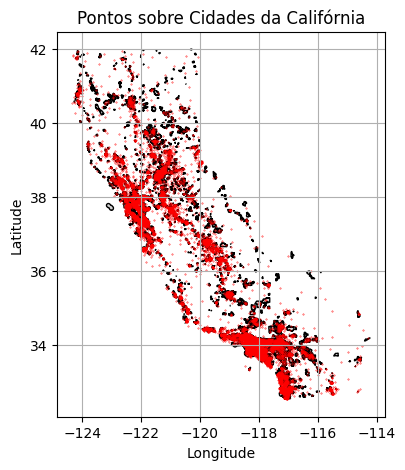

In [557]:
fig, ax = plt.subplots(figsize=(6,5))
gdf.plot(ax=ax, color='lightgray', edgecolor='black')
df_geo.plot(ax=ax, color='red', markersize=0.1)
plt.title("Pontos sobre Cidades da Califórnia")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.show()
# Muitos dos pontos não estão mapeados em nosso geodf

#### Há um grande número de linhas cuja cidade não foi encontrada



In [558]:
# df_geo.loc[df_geo['NAME'].isna()]
df_geo[df_geo['NAME'].isna()].count()

MedInc         2496
HouseAge       2496
AveRooms       2496
AveBedrms      2496
Population     2496
AveOccup       2496
Latitude       2496
Longitude      2496
MedHouseVal    2496
geometry       2496
index_right       0
NAME              0
dtype: int64

In [559]:
# Utilizar KNN para mapear os faltantes

from sklearn.neighbors import BallTree
import numpy as np

# Pontos com NaN
unmapped = df_geo[df_geo['NAME'].isna()].copy()
mapped = df_geo[~df_geo['NAME'].isna()].copy()

# Pega centroides das cidades
city_centroids = gdf[['geometry', 'NAME']].copy()
city_centroids['centroid'] = city_centroids.geometry.centroid
city_centroids = city_centroids.set_geometry('centroid')

# Constrói árvore de vizinhança (BallTree usa coordenadas em radianos)
city_coords_rad = np.radians(city_centroids.geometry.apply(lambda p: [p.y, p.x]).tolist())
tree = BallTree(city_coords_rad, metric='haversine')

# 4. Converte coordenadas dos pontos não mapeados
unmapped_coords_rad = np.radians(unmapped.geometry.apply(lambda p: [p.y, p.x]).tolist())

# 5. Consulta cidade mais próxima
distances, indices = tree.query(unmapped_coords_rad, k=1)
nearest_cities = city_centroids.iloc[indices.flatten()].reset_index()

# 6. Preenche os campos faltantes
# unmapped['COUNTY'] = nearest_cities['COUNTY'].values
unmapped['NAME'] = nearest_cities['NAME'].values

# 7. Junta com os dados mapeados anteriormente
df_filled = pd.concat([mapped, unmapped], ignore_index=True)


/tmp/ipykernel_12661/4041487832.py:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  city_centroids['centroid'] = city_centroids.geometry.centroid


In [560]:
df_filled[df_filled['NAME'].isna()].count()

MedInc         0
HouseAge       0
AveRooms       0
AveBedrms      0
Population     0
AveOccup       0
Latitude       0
Longitude      0
MedHouseVal    0
geometry       0
index_right    0
NAME           0
dtype: int64

In [561]:
# Redefinindo dataframe base
df = pd.read_csv("data/processed/california_housing.csv")

In [562]:
# Criando colunas 'County'
df['City'] = df_filled['NAME']

In [563]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       20640 non-null  float64
 1   HouseAge     20640 non-null  float64
 2   AveRooms     20640 non-null  float64
 3   AveBedrms    20640 non-null  float64
 4   Population   20640 non-null  float64
 5   AveOccup     20640 non-null  float64
 6   Latitude     20640 non-null  float64
 7   Longitude    20640 non-null  float64
 8   MedHouseVal  20640 non-null  float64
 9   City         20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


#### Escolhendo colunas uteis dos dataframe adicionais

In [564]:
df_public_schools = pd.read_csv("data/raw/schools/public_schools(2021-2022).csv")
df_public_schools.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9992 entries, 0 to 9991
Data columns (total 70 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   OBJECTID                             9992 non-null   int64  
 1   Year                                 9992 non-null   object 
 2   Fed ID                               9992 non-null   int64  
 3   CDS Code                             9992 non-null   int64  
 4   District Code                        9992 non-null   int64  
 5   School Code                          9992 non-null   int64  
 6   Region                               9991 non-null   float64
 7   County Name                          9992 non-null   object 
 8   District Name                        9992 non-null   object 
 9   School Name                          9992 non-null   object 
 10  School Type                          9992 non-null   object 
 11  Status                        

In [565]:
df_public_schools[['x', 'y']]

,x,y
0,-1.361085e+07,4.551870e+06
1,-1.360754e+07,4.549047e+06
2,-1.361255e+07,4.557887e+06
3,-1.360190e+07,4.549346e+06
4,-1.359414e+07,4.539376e+06
...,...,...
9987,-1.351746e+07,4.723343e+06
9988,-1.350689e+07,4.736389e+06
9989,-1.351756e+07,4.722619e+06
9990,-1.351756e+07,4.722619e+06


In [566]:
print(gdf.crs)

EPSG:4269


In [567]:
# Load the shapely file
gdf = gpd.read_file("data/raw/california cities/tl_2024_06_place.shp")

# Criar os pontos com o CRS original (supondo EPSG:3857)
geometry = gpd.points_from_xy(df_public_schools['x'], df_public_schools['y'])
df_geo = gpd.GeoDataFrame(df_public_schools, geometry=geometry, crs="EPSG:3857")

# Reprojetar para o mesmo CRS do shapefile
df_geo = df_geo.to_crs("EPSG:4269")

# Spatial join
df_geo = gpd.sjoin(df_geo, gdf[['geometry', 'NAME']], how='left', predicate='intersects')

df_public_schools['City'] = df_geo['NAME']


In [568]:
# KNN para os valores vazios
# Pontos com NaN
unmapped = df_geo[df_geo['NAME'].isna()].copy()
mapped = df_geo[~df_geo['NAME'].isna()].copy()

# Pega centroides das cidades
city_centroids = gdf[['geometry', 'NAME']].copy()
city_centroids['centroid'] = city_centroids.geometry.centroid
city_centroids = city_centroids.set_geometry('centroid')

# Constrói árvore de vizinhança (BallTree usa coordenadas em radianos)
city_coords_rad = np.radians(city_centroids.geometry.apply(lambda p: [p.y, p.x]).tolist())
tree = BallTree(city_coords_rad, metric='haversine')

# 4. Converte coordenadas dos pontos não mapeados
unmapped_coords_rad = np.radians(unmapped.geometry.apply(lambda p: [p.y, p.x]).tolist())

# 5. Consulta cidade mais próxima
distances, indices = tree.query(unmapped_coords_rad, k=1)
nearest_cities = city_centroids.iloc[indices.flatten()].reset_index()

# 6. Preenche os campos faltantes
# unmapped['COUNTY'] = nearest_cities['COUNTY'].values
unmapped['NAME'] = nearest_cities['NAME'].values

# 7. Junta com os dados mapeados anteriormente
df_filled = pd.concat([mapped, unmapped], ignore_index=True)

/tmp/ipykernel_12661/1974024559.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  city_centroids['centroid'] = city_centroids.geometry.centroid


In [569]:
df_public_schools = pd.read_csv("data/raw/schools/public_schools(2021-2022).csv")
df_public_schools['City'] = df_filled['NAME']

In [570]:
df_public_schools[df_public_schools['City'].isna()].count().sum()

0

In [571]:
df_public_schools['City']

0              Oakland
1              Oakland
2              Oakland
3              Oakland
4        Castro Valley
             ...      
9987    Monument Hills
9988           Dobbins
9989        Olivehurst
9990        Marysville
9991         Loma Rica
Name: City, Length: 9992, dtype: object

In [572]:
df_public_schools[df_public_schools['School Code'].duplicated(keep=False)]

,OBJECTID,Year,Fed ID,CDS Code,District Code,School Code,Region,County Name,District Name,School Name,...,Migrant,Migrant (%),Socioeconomically Disadvantaged,Socioeconomically Disadvantaged (%),Students with Disabilities,Students with Disabilities (%),Free/Reduced Meal Eligible,Free/Reduced Meal Eligible (%),x,y


In [573]:
public_schools_per_county = df_public_schools.groupby('City')['School Code'].count().sort_values(ascending=False).reset_index()
public_schools_per_county.rename(columns={'School Code': 'Quantity'}, inplace=True)
public_schools_per_county.head()

,City,Quantity
0,Los Angeles,818
1,San Diego,295
2,San Jose,237
3,Fresno,157
4,Sacramento,127


In [586]:
df_private_schools = pd.read_csv('data/raw/schools/private_schools(2025).csv')
df_private_schools.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3076 entries, 0 to 3075
Data columns (total 79 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   _id                              3076 non-null   int64  
 1   X                                2955 non-null   float64
 2   Y                                2955 non-null   float64
 3   ObjectID                         3076 non-null   int64  
 4   Loc_name                         2955 non-null   object 
 5   Status                           3076 non-null   object 
 6   Score                            3076 non-null   float64
 7   Match_type                       3076 non-null   object 
 8   Match_addr                       2955 non-null   object 
 9   User_fld                         2164 non-null   float64
 10  Addr_type                        2955 non-null   object 
 11  Side                             789 non-null    object 
 12  ARC_Street          

In [587]:
df_private_schools[df_private_schools['ARC_City'].isna()].count()

_id                               0
X                                 0
Y                                 0
ObjectID                          0
Loc_name                          0
                                 ..
Director_PrincipalOfficerEmail    0
CustodianofRecordsSalutation      0
CustodianofRecordsFirstName       0
CustodianofRecordsLastName        0
CustodianofRecordsEmail           0
Length: 79, dtype: int64

In [ ]:
df_private_schools.rename(columns=['ARC_City':'City'])

In [584]:
df_private_schools.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2955 entries, 0 to 3075
Data columns (total 79 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   _id                              2955 non-null   int64  
 1   X                                2955 non-null   float64
 2   Y                                2955 non-null   float64
 3   ObjectID                         2955 non-null   int64  
 4   Loc_name                         2955 non-null   object 
 5   Status                           2955 non-null   object 
 6   Score                            2955 non-null   float64
 7   Match_type                       2955 non-null   object 
 8   Match_addr                       2955 non-null   object 
 9   User_fld                         2164 non-null   float64
 10  Addr_type                        2955 non-null   object 
 11  Side                             789 non-null    object 
 12  ARC_Street               

In [580]:
df_private_schools[df_private_schools['City'].isna()].count()

_id                               116
X                                 116
Y                                 116
ObjectID                          116
Loc_name                          116
                                 ... 
Director_PrincipalOfficerEmail     94
CustodianofRecordsSalutation      115
CustodianofRecordsFirstName       116
CustodianofRecordsLastName        116
CustodianofRecordsEmail            98
Length: 79, dtype: int64

In [581]:
df_private_schools['ObjectID'].count()

2955

In [582]:
private_schools_per_county = df_private_schools.groupby('County')['ObjectID'].count().sort_values(ascending=False).reset_index()
private_schools_per_county.rename(columns={'ObjectID': 'Quantity'}, inplace=True)
private_schools_per_county.head()

,County,Quantity
0,Los Angeles,874
1,Orange,268
2,San Diego,223
3,Santa Clara,174
4,Alameda,130


In [583]:
# Juntando escolas públicas e particulares
df_schools_per_county = pd.merge(
    public_schools_per_county,
    private_schools_per_county,
    on = 'County',
    how = 'outer'
)

df_schools_per_county.head(2)

KeyError: 'County'

In [ ]:
df_schools_per_county.rename(columns={'Quantity_x': 'Public Schools', 'Quantity_y': 'Private Schools'}, inplace=True)

df_schools_per_county.fillna(0, inplace=True)

df_schools_per_county['Public Schools'] = df_schools_per_county['Public Schools'].astype(int)
df_schools_per_county['Private Schools'] = df_schools_per_county['Private Schools'].astype(int)

In [ ]:
# Add a total schools column
df_schools_per_county['Total Schools'] = df_schools_per_county['Public Schools'] + df_schools_per_county['Private Schools']

df_schools_per_county.sort_values(by='Total Schools', ascending=False).head()

,County,Public Schools,Private Schools,Total Schools
18,Los Angeles,2186,898,3084
36,San Diego,758,227,985
29,Orange,622,280,902
35,San Bernardino,555,131,686
32,Riverside,497,130,627


In [ ]:
df_schools_per_county = df_schools_per_county.drop(columns=['Public Schools', 'Private Schools'])
df_schools_per_county.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   County         58 non-null     object
 1   Total Schools  58 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 1.0+ KB


In [ ]:
df_hospitals = pd.read_csv('data/raw/hospitals/2018-2022-california-hospital-performance-coronary.csv')
df_hospitals.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1462 entries, 0 to 1461
Data columns (total 20 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Year                                                          1461 non-null   object 
 1   County                                                        1461 non-null   object 
 2   Hospital                                                      1461 non-null   object 
 3   Hospital ID                                                   1461 non-null   float64
 4   Performance Measure                                           1461 non-null   object 
 5   Total Statewide CABG Cases                                    1461 non-null   object 
 6   Total Statewide CABG Cases for Performance Measure Reporting  1461 non-null   object 
 7   Statewide Adverse Events                                      1461 no

In [ ]:
hospital_per_county = df_hospitals.groupby("County")['Hospital ID'].count().sort_values(ascending=False).reset_index()
hospital_per_county.rename(columns={'Hospital ID': 'Hospital_Count'}, inplace=True)
hospital_per_county.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   County          30 non-null     object
 1   Hospital_Count  30 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 608.0+ bytes


In [ ]:
df_transport = pd.read_excel('data/raw/public transport/walkable_distance_to_public_transportation.xlsx')
df_transport.info()

/home/rafanog/.local/lib/python3.10/site-packages/openpyxl/styles/stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
/home/rafanog/.local/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:223: UserWarning: Cell V27176 is marked as a date but the serial value 1694046482.752 is outside the limits for dates. The cell will be treated as an error.
  warn(msg)
/home/rafanog/.local/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:223: UserWarning: Cell V27177 is marked as a date but the serial value 1694046482.794 is outside the limits for dates. The cell will be treated as an error.
  warn(msg)
/home/rafanog/.local/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:223: UserWarning: Cell V27178 is marked as a date but the serial value 1694046482.813 is outside the limits for dates. The cell will be treated as an error.
  warn(msg)
/home/rafanog/.local/li

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66010 entries, 0 to 66009
Data columns (total 28 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   ind_id          66010 non-null  object        
 1   ind_definition  66006 non-null  object        
 2   reportyear      66006 non-null  object        
 3   race_eth_code   66006 non-null  object        
 4   race_eth_name   66006 non-null  object        
 5   geotype         66006 non-null  object        
 6   geotypevalue    66006 non-null  object        
 7   geoname         65952 non-null  object        
 8   county_name     65943 non-null  object        
 9   county_fips     65943 non-null  object        
 10  region_name     66006 non-null  object        
 11  region_code     66006 non-null  object        
 12  pop_trans_acc   64824 non-null  float64       
 13  pop2010         66006 non-null  float64       
 14  p_trans_acc     64449 non-null  float64       
 15  LL

In [ ]:
transport_available_per_county = df_transport.groupby('county_name')['pop_trans_acc'].sum().sort_values(ascending=False).reset_index()
transport_available_per_county.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19 entries, 0 to 18
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   county_name    19 non-null     object 
 1   pop_trans_acc  19 non-null     float64
dtypes: float64(1), object(1)
memory usage: 432.0+ bytes


In [ ]:
transport_available_per_county['county_name'] = transport_available_per_county['county_name'].str.replace('_x0020_', ' ', regex=False)
transport_available_per_county.rename(columns={'pop_trans_acc': 'Transport Available', 'county_name': 'County'}, inplace=True)
transport_available_per_county.info()

# Quantidade de pessoas com acesso á um bom ponto de transporte público ( < 15 min de distancia)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19 entries, 0 to 18
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   County               19 non-null     object 
 1   Transport Available  19 non-null     float64
dtypes: float64(1), object(1)
memory usage: 432.0+ bytes


In [ ]:
df_food = pd.read_excel('data/raw/food/food_affordability.xls')
df_food.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14365 entries, 0 to 14364
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   ind_id                    14365 non-null  object        
 1   ind_definition            14364 non-null  object        
 2   reportyear                14364 non-null  object        
 3   race_eth_code             14364 non-null  float64       
 4   race_eth_name             14364 non-null  object        
 5   geotype                   14364 non-null  object        
 6   geotypevalue              14364 non-null  float64       
 7   geoname                   14364 non-null  object        
 8   county_name               14229 non-null  object        
 9   county_fips               14229 non-null  float64       
 10  region_name               14364 non-null  object        
 11  region_code               14355 non-null  float64       
 12  cost_yr           

In [ ]:
df_food = df_food.dropna(subset=['county_name'])

In [ ]:
food_afford_per_county = df_food.groupby('county_name')['affordability_ratio'].mean().sort_values(ascending=False).reset_index()
food_afford_per_county.rename(columns={"county_name":"County"}, inplace=True)
food_afford_per_county.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   County               58 non-null     object 
 1   affordability_ratio  58 non-null     float64
dtypes: float64(1), object(1)
memory usage: 1.0+ KB


## Trazendo os dados à tabela principal

In [ ]:
df.drop(columns=['Latitude', 'Longitude'], inplace=True)
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal,County
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,4.526,Oakland
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,3.585,Oakland
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,3.521,Oakland
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,3.413,Oakland
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,3.422,Oakland


In [ ]:
# food_afford_per_county, transport_available,hospital_per_county, df_schools_per_county

In [ ]:
df = df.merge(df_schools_per_county, on = 'County', how='left')


In [ ]:
df['County'].unique()

array(['Oakland', 'Berkeley', 'Emeryville', ..., 'Challenge-Brownsville',
       'Rackerby', 'Dobbins'], dtype=object)

In [ ]:
# # Merge the dataframes on 'County'
# df = df.merge(food_afford_per_county, on='County', how='left')
# df = df.merge(transport_available_per_county, on='County', how='left')
# df = df.merge(hospital_per_county, on='County', how='left')
# df = df.merge(df_schools_per_county, on='County', how='left')

# # Display the updated dataframe
# df.info()